In [1]:
import json
import pandas as pd
pd.set_option('display.max_colwidth',100)
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow.keras as keras
import matplotlib.pyplot as plt
import math
import librosa, librosa.display
import librosa as lr

In [2]:
#training Data
metadata_train = pd.read_csv("E:/Project/vox1/metadata_train.txt", sep = ' ', header = None)
metadata_train.columns = ['true/false','location1','location2']
# metadata_train= pd.DataFrame(metadata_train)
y=metadata_train['location1'].unique()
y = pd.DataFrame(y)
y

,0
0,id10001/Y8hIVOBuels/00001.wav
1,id10001/Y8hIVOBuels/00002.wav
2,id10001/Y8hIVOBuels/00003.wav
3,id10001/Y8hIVOBuels/00004.wav
4,id10001/Y8hIVOBuels/00005.wav
...,...
137919,id11251/5-6lI5JQtb8/00001.wav
137920,id11251/5-6lI5JQtb8/00002.wav
137921,id11251/5-6lI5JQtb8/00003.wav
137922,id11251/5-6lI5JQtb8/00004.wav


In [3]:
y.columns=['location1']

In [4]:
# data = {
#     "labels" :[],
#     "value":[]
# }

In [4]:
output=[]

def reemovNestings(l):
    for i in l:
        if type(i) == list:
            reemovNestings(i)
        else:
            output.append(i)

In [5]:
data01=pd.DataFrame(columns=['labels','value'])
data01

,labels,value


In [6]:
def normalize(y):
    max_val=-1000000000000000;
    #getting the maximum amplitude value
    for i in range(len(y)):
        max_val=max(y[i],max_val)
     
    #normalizing the values
    for i in range(len(y)):
        y[i]=y[i]/abs(max_val)
    return y

In [7]:
def remove_silence(audio):
    clips = lr.effects.split(audio, top_db=10)
    #print(clips)
    wav_data = []
    #join each clipped section
    for c in clips:
        #print(c)
        data = audio[c[0]: c[1]]
        wav_data.extend(data)
   
    return wav_data

In [8]:
def plot(y, sr):
    time = np.arange(0, len(y))/sr
    fig, ax = plt.subplots()
    ax.plot(time,y)
    ax.set(xlabel='Time(s)',ylabel='sound amplitude')
    plt.show()

In [28]:
for i in y.index[:5000]:
    sample = y.loc[i,'location1']
    sample_1_path = 'E:/Project/vox1/wav/'+sample
    file = sample_1_path
#     print(file[31:38])
    signal, sample_rate = librosa.load(file, sr=16000)
#     data["labels"].append(sample[0:7]) 
#     data["value"].append(signal.tolist())
#     signal=""
    signal=normalize(signal)
    signal=remove_silence(signal)
    #plot(signal, sample_rate)
    
    data1=pd.DataFrame([[sample[0:7],signal]],columns=['labels','value'])
#     print(data1)
    del signal
    data01=data01.append(data1)
    del data1
    print(i)
#     print(signal)
new=data01.groupby('labels').agg(lambda x: x.tolist())

# del data01

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [29]:
new

,value
labels,
id10001,"[[-0.1550579, -0.24599795, -0.29564032, -0.30568802, -0.30372956, -0.2844857, -0.23467302, -0.19..."
id10002,"[[0.14051522, 0.16112413, 0.17868853, 0.18899298, 0.19578454, 0.20070258, 0.19812647, 0.19156909..."
id10003,"[[-0.03925297, 0.070152804, 0.112767406, 0.09351443, 0.036027163, 0.15045841, 0.053887945, 0.068..."
id10004,"[[-0.03107861, 0.0160315, 0.084938824, 0.13366616, 0.13605681, 0.10455632, 0.06939952, 0.0459850..."
id10005,"[[0.069469094, 0.066322416, 0.065757625, 0.06422462, 0.06269162, 0.051637888, 0.039857995, 0.022..."
id10006,"[[-0.3569987, -0.25279766, -0.14914694, -0.07723354, -0.111355714, -0.114107504, -0.04329481, 0...."
id10007,"[[0.012095555, -0.21016027, -0.11672211, 0.022225583, 0.31478682, 0.1005443, -0.05352283, 0.1365..."
id10008,"[[0.21112135, 0.11355833, -0.023364877, -0.13080981, -0.18566284, -0.16908132, -0.061636377, 0.0..."
id10009,"[[0.00053804764, -0.0013066871, 0.0009992314, -0.003074558, -0.001537279, 0.0009223674, -0.00676..."


In [13]:
new.to_csv("data_01.csv")

In [30]:
k=new['value'][0]

In [31]:
type(k)

list

In [32]:
len(k[0]) #k is a list of arrays here

41217

In [33]:
k

[[-0.1550579,
  -0.24599795,
  -0.29564032,
  -0.30568802,
  -0.30372956,
  -0.2844857,
  -0.23467302,
  -0.19652589,
  -0.15684605,
  -0.13530314,
  -0.18196526,
  -0.21525885,
  -0.25383174,
  -0.28755108,
  -0.2501703,
  -0.20001704,
  -0.07689033,
  0.11214237,
  0.31565055,
  0.5333787,
  0.7014646,
  0.7759707,
  0.73220366,
  0.5375511,
  0.29002044,
  0.09434605,
  -0.102690734,
  -0.2822718,
  -0.4038658,
  -0.46142712,
  -0.42924047,
  -0.40923023,
  -0.3955211,
  -0.35158378,
  -0.34860355,
  -0.35805517,
  -0.33753407,
  -0.24037807,
  -0.05611376,
  0.14449932,
  0.33046663,
  0.5302282,
  0.7109162,
  0.80653954,
  0.78125,
  0.64577657,
  0.4432902,
  0.2127895,
  -0.011920981,
  -0.19363078,
  -0.31811988,
  -0.3741485,
  -0.40429154,
  -0.4390327,
  -0.4373297,
  -0.3965429,
  -0.32689032,
  -0.2785252,
  -0.25757834,
  -0.17447206,
  -0.029376702,
  0.13428134,
  0.28933924,
  0.42889985,
  0.55126023,
  0.6070334,
  0.58114785,
  0.5095368,
  0.40514305,
  0.24088897

In [18]:
#we need to convert from a list of arrays to a single list

In [34]:
List=[]
for i in k: #i will be an array
    List.extend(i)

In [35]:
List=np.asarray(List)

In [36]:
MFCCs = librosa.feature.mfcc(List, 16000, n_fft=2048, hop_length=512, n_mfcc=13)

C:\Users\DELL\AppData\Local\Temp/ipykernel_24620/1549071761.py:1: FutureWarning: Pass y=[-0.1550579  -0.24599795 -0.29564032 ...  0.01877679  0.01660327
  0.01304112], sr=16000 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  MFCCs = librosa.feature.mfcc(List, 16000, n_fft=2048, hop_length=512, n_mfcc=13)


In [13]:
k=new['value'][0]

In [14]:
string = ','.join(str(x) for x in k)
type(string)

str

In [15]:
type(new['value'][0][0])

list

In [16]:
# reemovNestings(string)
# output

MemoryError: 

In [ ]:
# y=24722
# z=y%200
# m=200-z
# n=y+m
# print(int(n/200),k,z,n)


In [ ]:
# n/200

In [37]:
def removeNestings(k):
    List=[]
    for i in k: #i will be an array
        List.extend(i)
    List=np.asarray(List)
    return List

In [38]:
newmfcc=[]
for i in new.index:
    l=removeNestings(new['value'][i])
#     output
#     l=np.asarray(output)
#     output=[]
#     print(l)
    MFCCs = librosa.feature.mfcc(l, 16000, n_fft=2048, hop_length=512, n_mfcc=13)
    mfcc=MFCCs.T
    shape = mfcc.shape[0]
    z=shape%200
    m=200-z
    n=shape+m
    mfcc1=np.resize(mfcc,(n,13))
    mfcc2=np.reshape(mfcc1,(int(n/200),200,13))
    newmfcc.append(mfcc2)
#     print(mfcc.shape[1])
#     mfcc1=np.resize(mfcc,(50000,13)) #resizing the mfcc value
#     mfcc2=np.reshape(mfcc1,(100,500,13))  #reshaping as 3d vector
#     newmfcc.append(mfcc2)

C:\Users\DELL\AppData\Local\Temp/ipykernel_24620/119066400.py:8: FutureWarning: Pass y=[-0.1550579  -0.24599795 -0.29564032 ...  0.01877679  0.01660327
  0.01304112], sr=16000 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  MFCCs = librosa.feature.mfcc(l, 16000, n_fft=2048, hop_length=512, n_mfcc=13)
C:\Users\DELL\AppData\Local\Temp/ipykernel_24620/119066400.py:8: FutureWarning: Pass y=[ 0.14051522  0.16112413  0.17868853 ... -0.01082844 -0.02137509
 -0.02821834], sr=16000 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  MFCCs = librosa.feature.mfcc(l, 16000, n_fft=2048, hop_length=512, n_mfcc=13)
C:\Users\DELL\AppData\Local\Temp/ipykernel_24620/119066400.py:8: FutureWarning: Pass y=[-0.03925297  0.0701528   0.11276741 ... -0.06874066 -0.09183535
 -0.10759408], sr=16000 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  MFCCs = librosa.fea

In [10]:
# newmfcc[0]

Error in sys.excepthook:
Traceback (most recent call last):
  File "C:\Users\ankit\anaconda3\envs\tensorflow_env\lib\site-packages\IPython\core\interactiveshell.py", line 3397, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\ankit\AppData\Local\Temp\ipykernel_13172\598392009.py", line 1, in <cell line: 1>
TypeError: 'int' object is not callable

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\ankit\anaconda3\envs\tensorflow_env\lib\site-packages\executing\executing.py", line 317, in executing
    args = executing_cache[key]
KeyError: (<code object run_code at 0x000001AE47527920, file "C:\Users\ankit\anaconda3\envs\tensorflow_env\lib\site-packages\IPython\core\interactiveshell.py", line 3361>, 1848032524576, 74)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\ankit\anaconda3\envs\tensorflow_env\lib\site-pack

TypeError: 'int' object is not callable

In [10]:
# newmfcc=[]
# for i in new.index:
#     reemovNestings(new['value'][i])
#     output
#     l=np.asarray(output)
#     output=[]
#     print(l)
#     MFCCs = librosa.feature.mfcc(l, 16000, n_fft=2048, hop_length=512, n_mfcc=13)
#     mfcc=MFCCs.T
#     print(mfcc)
#     mfcc1=np.resize(mfcc,(50000,13)) #resizing the mfcc value
#     mfcc2=np.reshape(mfcc1,(100,500,13))  #reshaping as 3d vector
#     newmfcc.append(mfcc2)
#     print(mfcc.shape)
#     type(mfcc)
    

[-0.05557251 -0.08816528 -0.10595703 ...  0.07470703  0.0798645
  0.07873535]


C:\Users\ankit\AppData\Local\Temp\ipykernel_11520\2222661215.py:8: FutureWarning: Pass y=[-0.05557251 -0.08816528 -0.10595703 ...  0.07470703  0.0798645
  0.07873535], sr=16000 as keyword args. From version 0.10 passing these as positional arguments will result in an error
  MFCCs = librosa.feature.mfcc(l, 16000, n_fft=2048, hop_length=512, n_mfcc=13)


[[-177.80406143  141.10105188  -50.59793166 ...    3.0567477
   -10.27750628  -21.47763152]
 [-172.48179279  125.0318206   -60.77817706 ...   -3.17132013
    -5.99933576  -22.62035693]
 [-188.12133225  104.9453401   -62.67864517 ...   -6.31022779
    -5.53904717  -26.14233564]
 ...
 [-312.46469203  127.51006132  -17.78664957 ...    0.46594351
    -1.51485325  -23.61874025]
 [-303.0974746   129.54612019   12.41748101 ...   -0.78773358
    -9.97550605  -20.80107949]
 [-247.74684592  121.97717604    3.1166556  ...   -2.34045064
    -7.59846118   -2.91341724]]


In [15]:
new=pd.DataFrame(new)

In [9]:
new['value'][0]

[[-0.055572509765625,
  -0.088165283203125,
  -0.10595703125,
  -0.10955810546875,
  -0.108856201171875,
  -0.101959228515625,
  -0.0841064453125,
  -0.0704345703125,
  -0.05621337890625,
  -0.048492431640625,
  -0.065216064453125,
  -0.0771484375,
  -0.090972900390625,
  -0.103057861328125,
  -0.08966064453125,
  -0.071685791015625,
  -0.027557373046875,
  0.040191650390625,
  0.113128662109375,
  0.191162109375,
  0.25140380859375,
  0.278106689453125,
  0.262420654296875,
  0.192657470703125,
  0.10394287109375,
  0.0338134765625,
  -0.03680419921875,
  -0.101165771484375,
  -0.144744873046875,
  -0.165374755859375,
  -0.153839111328125,
  -0.14666748046875,
  -0.141754150390625,
  -0.126007080078125,
  -0.12493896484375,
  -0.128326416015625,
  -0.1209716796875,
  -0.086151123046875,
  -0.020111083984375,
  0.051788330078125,
  0.118438720703125,
  0.190032958984375,
  0.254791259765625,
  0.2890625,
  0.279998779296875,
  0.2314453125,
  0.15887451171875,
  0.076263427734375,
  -0

In [14]:
new.to_csv("read.csv")

In [15]:
new=pd.read_csv("read.csv")

In [10]:
np.shape(new['value'][0][0])

(72961,)

In [8]:
# data01=data01.groupby('labels').agg(lambda x: x.tolist())
# data01

In [9]:
# np.shape(data01['value'][0][0])

In [12]:
from numpy import array
val = array(new['value'])

In [13]:
val[0]

[array([-0.05557251, -0.08816528, -0.10595703, ...,  0.00619507,
         0.00537109,  0.00363159], dtype=float32),
 array([0.00231934, 0.00201416, 0.00268555, ..., 0.00894165, 0.01144409,
        0.0163269 ], dtype=float32),
 array([-0.00521851, -0.0055542 , -0.00595093, ...,  0.03320312,
         0.04779053,  0.05563354], dtype=float32),
 array([-0.00408936, -0.00384521, -0.00354004, ...,  0.00390625,
         0.00723267, -0.00360107], dtype=float32),
 array([-0.00387573, -0.0038147 , -0.00369263, ..., -0.06454468,
        -0.06732178, -0.06967163], dtype=float32),
 array([ 0.07025146,  0.07028198,  0.09155273, ..., -0.08630371,
        -0.11706543, -0.15368652], dtype=float32),
 array([ 0.17382812,  0.12203979,  0.10177612, ..., -0.11526489,
        -0.12719727, -0.13497925], dtype=float32),
 array([0.01626587, 0.01171875, 0.05371094, ..., 0.00881958, 0.01272583,
        0.0145874 ], dtype=float32),
 array([-0.00900269, -0.00735474, -0.00982666, ...,  0.00772095,
        -0.01022339

In [10]:
len(data01['value'])

500

In [11]:
# data1=pd.DataFrame(data)

In [12]:
# np.shape(data1['value'][0])

In [13]:
# new=data01.groupby('labels').agg(lambda x: x.tolist())
# pd.set_option('display.max_colwidth',100)
# new=new[['value']]

In [9]:
new

,value
labels,
id10001,"[[-0.055572509765625, -0.088165283203125, -0.1..."
id10002,"[[0.018310546875, 0.02099609375, 0.02328491210..."
id10003,"[[-0.0352783203125, 0.06304931640625, 0.101348..."
id10004,"[[0.0155029296875, 0.0111083984375, 0.00259399..."
id10005,"[[-0.00335693359375, 0.0013427734375, 0.004211..."


In [11]:
type(new['value'][0])

list

In [16]:
# new['newval']=""
# for i in new.index:
#     new['newval'][i]=np.asarray(new['value'][i])

In [17]:
# new

In [18]:
# np.shape(new['value'][0][0])

In [16]:
from numpy import array

In [20]:
# val = array(new['value'])

In [13]:
new['value'][2]

[[-0.0352783203125,
  0.06304931640625,
  0.101348876953125,
  0.08404541015625,
  0.032379150390625,
  0.135223388671875,
  0.048431396484375,
  0.061614990234375,
  0.151611328125,
  0.061798095703125,
  0.0635986328125,
  0.0963134765625,
  0.08111572265625,
  0.004913330078125,
  0.090423583984375,
  0.04107666015625,
  0.0836181640625,
  0.065582275390625,
  0.09613037109375,
  0.1204833984375,
  0.18048095703125,
  0.179351806640625,
  0.16241455078125,
  0.226654052734375,
  0.25628662109375,
  0.298492431640625,
  0.2955322265625,
  0.3060302734375,
  0.387451171875,
  0.41619873046875,
  0.36627197265625,
  0.484527587890625,
  0.465850830078125,
  0.50048828125,
  0.469573974609375,
  0.48406982421875,
  0.468719482421875,
  0.493865966796875,
  0.517486572265625,
  0.504547119140625,
  0.481689453125,
  0.489105224609375,
  0.459381103515625,
  0.45843505859375,
  0.39990234375,
  0.38995361328125,
  0.3790283203125,
  0.311065673828125,
  0.313995361328125,
  0.296173095703

In [15]:
reemovNestings(new['value'][2])

In [16]:
output

[-0.0352783203125,
 0.06304931640625,
 0.101348876953125,
 0.08404541015625,
 0.032379150390625,
 0.135223388671875,
 0.048431396484375,
 0.061614990234375,
 0.151611328125,
 0.061798095703125,
 0.0635986328125,
 0.0963134765625,
 0.08111572265625,
 0.004913330078125,
 0.090423583984375,
 0.04107666015625,
 0.0836181640625,
 0.065582275390625,
 0.09613037109375,
 0.1204833984375,
 0.18048095703125,
 0.179351806640625,
 0.16241455078125,
 0.226654052734375,
 0.25628662109375,
 0.298492431640625,
 0.2955322265625,
 0.3060302734375,
 0.387451171875,
 0.41619873046875,
 0.36627197265625,
 0.484527587890625,
 0.465850830078125,
 0.50048828125,
 0.469573974609375,
 0.48406982421875,
 0.468719482421875,
 0.493865966796875,
 0.517486572265625,
 0.504547119140625,
 0.481689453125,
 0.489105224609375,
 0.459381103515625,
 0.45843505859375,
 0.39990234375,
 0.38995361328125,
 0.3790283203125,
 0.311065673828125,
 0.313995361328125,
 0.296173095703125,
 0.267852783203125,
 0.258544921875,
 0.23345

In [17]:
len(output)

15907371

In [25]:
array1

[array([-0.03527832,  0.06304932,  0.10134888, ..., -0.05078125,
        -0.04595947, -0.04498291], dtype=float32),
 array([-0.16287231, -0.16946411, -0.17037964, ..., -0.03903198,
        -0.00366211,  0.0045166 ], dtype=float32),
 array([ 0.0289917 ,  0.01168823,  0.00582886, ..., -0.06280518,
        -0.05682373, -0.06335449], dtype=float32),
 array([-0.00695801, -0.0017395 ,  0.00152588, ..., -0.04446411,
        -0.03417969, -0.02099609], dtype=float32),
 array([-0.03588867, -0.02185059, -0.00439453, ...,  0.01293945,
         0.01113892,  0.02001953], dtype=float32),
 array([ 0.00360107,  0.00674438,  0.0123291 , ..., -0.03942871,
        -0.0383606 , -0.03396606], dtype=float32),
 array([ 0.01608276,  0.01391602,  0.01025391, ..., -0.01660156,
         0.01809692,  0.04434204], dtype=float32),
 array([-0.08309937, -0.08132935, -0.08084106, ..., -0.11773682,
        -0.19570923, -0.24978638], dtype=float32),
 array([ 0.03720093,  0.01919556,  0.00708008, ..., -0.03820801,
       

In [26]:
# len(new['value'][0])

In [27]:
# type(new['val01'][0])

In [17]:
newmfcc

[]

In [24]:
len(newmfcc)

11

In [25]:
# np.reshape(newmfcc[12],(100,500,13)).shape

In [26]:
new.index

Index(['id10001', 'id10002', 'id10003', 'id10004', 'id10005', 'id10006',
       'id10007', 'id10008', 'id10009', 'id10010', 'id10011'],
      dtype='object', name='labels')

In [33]:
len(newmfcc[10])

75

In [29]:
len(newmfcc)

26

In [30]:
# currentarr=[]
# for i in range(25):
#     split=np.array_split(newmfcc[i],100)
#     np.reshape(split,(500,13))
#     print(len(split))

In [31]:
# len(currentarr)

In [29]:
len(newmfcc[0])

91

In [30]:
split=np.array_split(newmfcc[0],100)
len(split)

100

In [31]:
  #making 2d arrays from 3d array

currentarr=[]
for i in range(0,26):
    split=np.array_split(newmfcc[i],100)
    split=np.asarray(split)
    for j in range(0,len(split)):
        z=np.reshape(split[j],(500,13))
        currentarr.append(z)

<ipython-input-31-b046dfe411bf>:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  split=np.asarray(split)


ValueError: cannot reshape array of size 2600 into shape (500,13)

In [35]:
len(currentarr)

2600

In [36]:
# newmfcc

In [37]:
currentarr=np.asarray(currentarr)

In [38]:
currentarr.shape

(2600, 500, 13)

In [39]:
# split=np.asarray(split)
# z=np.reshape(split[99],(500,13))
# z

In [40]:
# y=np.asarray(split)

In [41]:
# y.shape

In [42]:
# split[0][0][1]

In [43]:
arrlist=[]
k=1
for each in new.index:
    c=0
    while(c<100):
        arrlist.append(each)
        c=c+1
    k=k+1

In [44]:
len(arrlist)

2600

In [45]:
arrlist=pd.DataFrame(arrlist)
arrlist[0].value_counts()

id10001    100
id10002    100
id10025    100
id10024    100
id10023    100
id10022    100
id10021    100
id10020    100
id10019    100
id10018    100
id10017    100
id10016    100
id10015    100
id10014    100
id10013    100
id10012    100
id10011    100
id10010    100
id10009    100
id10008    100
id10007    100
id10006    100
id10005    100
id10004    100
id10003    100
id10026    100
Name: 0, dtype: int64

In [46]:
#labels into array
import numpy as np
from keras.utils.np_utils import to_categorical
from sklearn import preprocessing
labelEncode=preprocessing.LabelEncoder()
labelEncode.fit(arrlist[0])
print (labelEncode.classes_)
train_labelEncode=labelEncode.transform(arrlist[0])
label=to_categorical(np.asarray(train_labelEncode))
label

['id10001' 'id10002' 'id10003' 'id10004' 'id10005' 'id10006' 'id10007'
 'id10008' 'id10009' 'id10010' 'id10011' 'id10012' 'id10013' 'id10014'
 'id10015' 'id10016' 'id10017' 'id10018' 'id10019' 'id10020' 'id10021'
 'id10022' 'id10023' 'id10024' 'id10025' 'id10026']


array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]], dtype=float32)

2600

In [47]:
#TRAIN TEST SPLIT
X_train, X_test, y_train, y_test = train_test_split(currentarr, label, test_size=0.3)


In [48]:
import tensorflow as tf
from keras.models import Sequential,Model
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers.convolutional import Conv2D
from keras.layers.convolutional import MaxPooling2D
from tensorflow.keras.layers import Conv1D, GlobalMaxPooling1D, MaxPooling1D,LSTM,Bidirectional,GlobalAveragePooling1D,Dropout, Activation, Flatten, Embedding,Input

In [101]:
inputs = Input(shape=(500, 13))
conv = Conv1D(filters=32, kernel_size=2, activation='relu')(inputs)
pool = MaxPooling1D(pool_size=(5))(conv)
conv2=Conv1D(64,(3),activation='relu')(pool)
pool2=MaxPooling1D(pool_size=(2),padding='same')(conv2)
flat = Flatten()(pool2)

In [106]:
dense1 = Dense(128, activation='relu')(flat)
outputs = Dense(len(new.index), activation='sigmoid')(dense1)
model = Model(inputs=inputs, outputs=outputs)
model.summary()

Model: "model_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 500, 13)]         0         
_________________________________________________________________
conv1d_10 (Conv1D)           (None, 499, 32)           864       
_________________________________________________________________
conv1d_11 (Conv1D)           (None, 497, 64)           6208      
_________________________________________________________________
max_pooling1d_10 (MaxPooling (None, 249, 64)           0         
_________________________________________________________________
flatten_6 (Flatten)          (None, 15936)             0         
_________________________________________________________________
dense_14 (Dense)             (None, 128)               2039936   
_________________________________________________________________
dense_15 (Dense)             (None, 26)                3354

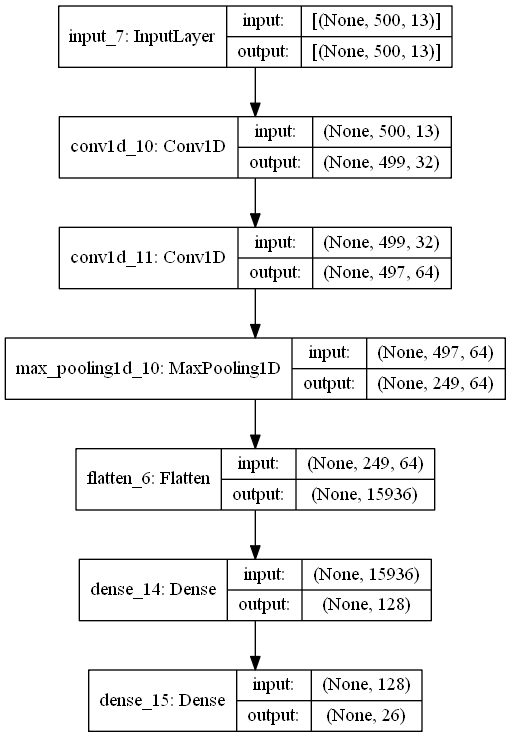

In [107]:
tf.keras.utils.plot_model(model, to_file='model_test.png', show_shapes=True, show_layer_names=True)

In [108]:
model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

In [109]:
model.fit(X_train,y_train, validation_data=(X_test,y_test), epochs = 100, verbose = 1)
# model.fit(currentarr,label,  epochs = 100, verbose = 1)

Epoch 1/100
57/57 [==============================] - 2s 25ms/step - loss: 2.7459 - accuracy: 0.2819 - val_loss: 2.3009 - val_accuracy: 0.3744
Epoch 2/100
57/57 [==============================] - 1s 20ms/step - loss: 0.4412 - accuracy: 0.8819 - val_loss: 2.3074 - val_accuracy: 0.4115
Epoch 3/100
57/57 [==============================] - 1s 20ms/step - loss: 0.1104 - accuracy: 0.9747 - val_loss: 2.7951 - val_accuracy: 0.3795
Epoch 4/100
57/57 [==============================] - 1s 21ms/step - loss: 0.0595 - accuracy: 0.9742 - val_loss: 2.5998 - val_accuracy: 0.4013
Epoch 5/100
57/57 [==============================] - 1s 21ms/step - loss: 0.0481 - accuracy: 0.9747 - val_loss: 2.4974 - val_accuracy: 0.4141
Epoch 6/100
57/57 [==============================] - 1s 21ms/step - loss: 0.0389 - accuracy: 0.9764 - val_loss: 2.6129 - val_accuracy: 0.4026
Epoch 7/100
57/57 [==============================] - 1s 21ms/step - loss: 0.0321 - accuracy: 0.9791 - val_loss: 2.6120 - val_accuracy: 0.4154
Epoch 

In [75]:
test_predictions = model.predict(X_test)
# Finding out of two output neurons which one has highest probability
# It will return us the predicted class
# It will convert probability into final class 1 and 0
test_predictions1 = np.zeros_like(test_predictions)
test_predictions1[np.arange(len(test_predictions)), test_predictions.argmax(1)] = 1


In [76]:
#Accuracy 
from sklearn.metrics import classification_report
print(classification_report(y_test,test_predictions1))

              precision    recall  f1-score   support

           0       0.12      0.20      0.15        35
           1       0.62      0.68      0.65        31
           2       0.11      0.11      0.11        27
           3       0.28      0.38      0.32        29
           4       0.13      0.19      0.16        31
           5       0.22      0.68      0.33        28
           6       0.24      0.32      0.28        28
           7       0.32      0.35      0.33        23
           8       0.17      0.12      0.14        33
           9       0.29      0.27      0.28        33
          10       0.52      0.52      0.52        33
          11       0.43      0.29      0.34        35
          12       0.30      0.19      0.24        31
          13       0.38      0.28      0.32        36
          14       0.38      0.27      0.31        30
          15       0.32      0.22      0.26        32
          16       0.33      0.20      0.25        30
          17       0.45    

In [121]:
model1 = Sequential()
model1.add(Input(shape=(500, 13)))
model1.add(Conv1D(filters = 128,kernel_size=2, activation='relu'))
#model.add(MaxPooling1D(3, strides=1,padding='same'))
model1.add(Conv1D(filters = 64,kernel_size=2, activation='relu'))
# model1.add(MaxPooling1D(3, strides=1,padding='same'))
model1.add(Conv1D(filters = 64,kernel_size=2, activation='relu'))
# model1.add(MaxPooling1D(5, strides=1,padding='same'))
model1.add(Conv1D(filters = 32,kernel_size=2, activation='relu'))
model1.add(MaxPooling1D(3, strides=1,padding='same'))
model1.add(Flatten())
model1.add(Dense(128, activation = 'relu'))
# model1.add(Dense(64, activation = 'relu'))
# model1.add(Dense(64, activation = 'relu'))
model1.add(Dense(26, activation = 'sigmoid'))
model1.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_22 (Conv1D)           (None, 499, 128)          3456      
_________________________________________________________________
conv1d_23 (Conv1D)           (None, 498, 64)           16448     
_________________________________________________________________
conv1d_24 (Conv1D)           (None, 497, 64)           8256      
_________________________________________________________________
conv1d_25 (Conv1D)           (None, 496, 32)           4128      
_________________________________________________________________
max_pooling1d_17 (MaxPooling (None, 496, 32)           0         
_________________________________________________________________
flatten_10 (Flatten)         (None, 15872)             0         
_________________________________________________________________
dense_22 (Dense)             (None, 128)              

In [122]:
model1.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ['accuracy'])

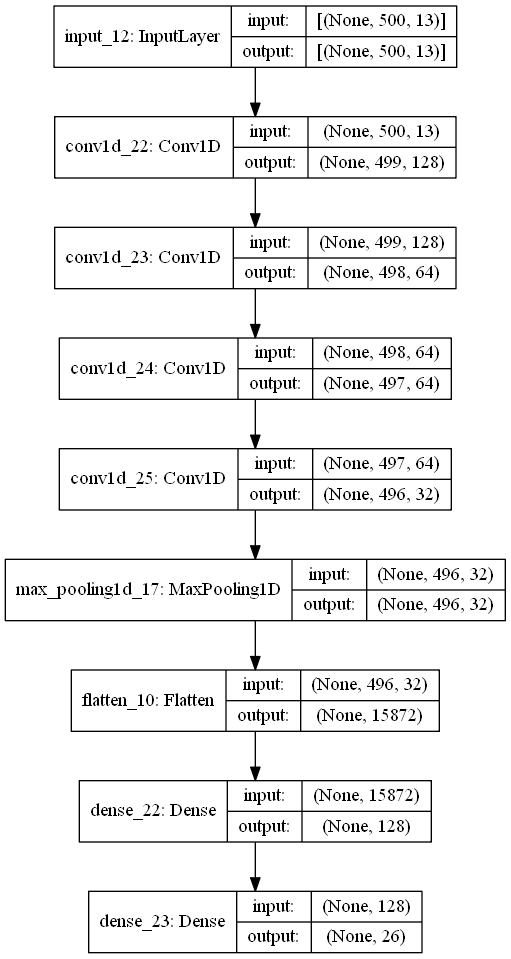

In [123]:
tf.keras.utils.plot_model(model1, to_file='model_test.png', show_shapes=True, show_layer_names=True)

In [124]:
model1.fit(X_train,y_train, validation_data=(X_test,y_test), epochs = 100, verbose = 1)

Epoch 1/100
57/57 [==============================] - 3s 47ms/step - loss: 8.4652 - accuracy: 0.0681 - val_loss: 2.9769 - val_accuracy: 0.1115
Epoch 2/100
57/57 [==============================] - 2s 40ms/step - loss: 2.6922 - accuracy: 0.1698 - val_loss: 2.7661 - val_accuracy: 0.1667
Epoch 3/100
57/57 [==============================] - 2s 39ms/step - loss: 2.3324 - accuracy: 0.3198 - val_loss: 3.0598 - val_accuracy: 0.1474
Epoch 4/100
57/57 [==============================] - 2s 40ms/step - loss: 1.3617 - accuracy: 0.5923 - val_loss: 3.5531 - val_accuracy: 0.1500
Epoch 5/100
57/57 [==============================] - 2s 40ms/step - loss: 0.7906 - accuracy: 0.7725 - val_loss: 4.5300 - val_accuracy: 0.1705
Epoch 6/100
57/57 [==============================] - 2s 40ms/step - loss: 0.5220 - accuracy: 0.8621 - val_loss: 4.3657 - val_accuracy: 0.1833
Epoch 7/100
57/57 [==============================] - 2s 40ms/step - loss: 0.2603 - accuracy: 0.9363 - val_loss: 4.7866 - val_accuracy: 0.1910
Epoch 

In [116]:
test_predictions = model1.predict(X_test)
# Finding out of two output neurons which one has highest probability
# It will return us the predicted class
# It will convert probability into final class 1 and 0
test_predictions1 = np.zeros_like(test_predictions)
test_predictions1[np.arange(len(test_predictions)), test_predictions.argmax(1)] = 1


In [117]:
#Accuracy 
from sklearn.metrics import classification_report
print(classification_report(y_test,test_predictions1))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        35
           1       0.35      0.26      0.30        31
           2       0.05      0.07      0.06        27
           3       0.00      0.00      0.00        29
           4       0.13      0.13      0.13        31
           5       0.29      0.39      0.33        28
           6       0.56      0.68      0.61        28
           7       0.17      0.26      0.21        23
           8       0.23      0.18      0.20        33
           9       0.04      0.03      0.03        33
          10       0.29      0.24      0.26        33
          11       0.21      0.20      0.20        35
          12       0.26      0.29      0.27        31
          13       0.20      0.17      0.18        36
          14       0.49      0.57      0.52        30
          15       0.06      0.06      0.06        32
          16       0.05      0.03      0.04        30
          17       0.06    

In [57]:
# data
# len(output)
# i

In [58]:
# new


In [59]:
# y.shape

In [60]:
# new['newval']=''
# for i in new.index:
#     reemovNestings(new['value'][i])
#     new['newval'][i]=output

In [61]:
# new1=new.head(2)

In [62]:
# new1 = pd.DataFrame(new1)

In [63]:
# len(new1['value'][0][0])

In [64]:
# new1.to_csv("D:/Data science/INTERNSHIP/data02.csv")

In [65]:
# data =pd.read_csv("D:/Data science/INTERNSHIP/data02.csv")

In [66]:
# data

In [67]:
# output

In [68]:
# l=np.asarray(output)

In [69]:
# type(l)

In [70]:
# MFCCs = librosa.feature.mfcc(l, 16000, n_fft=2048, hop_length=512, n_mfcc=13)
# mfcc=MFCCs.T

In [71]:
# mfcc

In [72]:
# mfcc.shape

In [73]:
# y =np.resize(mfcc,(50000,13))

In [74]:
# y.shape